In [ ]:
!pip install hvac

### Vault Functions

In [2]:
import hvac
import sys
import time

import subprocess
import threading

def create_vault_client():
    # Set up the Vault client
    client = hvac.Client(url='http://localhost:8200')

    # Authenticate with the root token provided when starting the Vault server in development mode
    client.token = 'dev-only-token' #THIS IS FOR TESTING ONLY, WE WOULD NEVER STORE HERE

    return client

def run_command():
    command = "vault server -dev -dev-root-token-id=dev-only-token" #TESTING ONLY THIS IS IN DEV MODE
    subprocess.run(command, shell=True)

def get_stored_token(client):
    # Set up the Vault client
    #client = hvac.Client(url='http://localhost:8200')

    # Authenticate with the root token provided when starting the Vault server in development mode
    #client.token = 'dev-only-token'

    # Retrieve the stored token from Vault
    try:
        response = client.secrets.kv.v2.read_secret_version(
            path='secret/data/token',raise_on_deleted_version=True
        )
        stored_token = response['data']['data']['value']
        return stored_token
    except Exception as e:
        print("Error retrieving stored token:", e)
        return None

run_vault = threading.Thread(target=run_command)
run_vault.start()
time.sleep(5)

# Set up the Vault client
client = hvac.Client(url='http://localhost:8200')

# Authenticate with the root token provided when starting the Vault server in development mode
client.token = 'dev-only-token'

# Store the token in the Vault
create_response = client.secrets.kv.v2.create_or_update_secret(
    path='secret/data/token',
    secret=dict(value='!Q#E%T&U8i6y4r2w')
)

# For testing
"""
stored_token = get_stored_token()
if stored_token:
    print("Stored token:", stored_token)
else:
    print("Failed to retrieve stored token")
"""


==> Vault server configuration:

Administrative Namespace: 
             Api Address: http://127.0.0.1:8200
                     Cgo: disabled
         Cluster Address: https://127.0.0.1:8201
   Environment Variables: CLICOLOR, CLICOLOR_FORCE, COLORTERM, DBUS_SESSION_BUS_ADDRESS, DBUS_STARTER_ADDRESS, DBUS_STARTER_BUS_TYPE, DEBUGINFOD_URLS, DESKTOP_SESSION, DISPLAY, FORCE_COLOR, GDMSESSION, GIT_PAGER, GNOME_DESKTOP_SESSION_ID, GNOME_SETUP_DISPLAY, GNOME_SHELL_SESSION_MODE, GNOME_TERMINAL_SCREEN, GNOME_TERMINAL_SERVICE, GODEBUG, GTK_MODULES, HOME, IM_CONFIG_PHASE, JPY_PARENT_PID, JPY_SESSION_NAME, LANG, LOGNAME, MPLBACKEND, PAGER, PATH, PWD, PYDEVD_USE_FRAME_EVAL, QT_ACCESSIBILITY, QT_IM_MODULE, SESSION_MANAGER, SHELL, SSH_AGENT_LAUNCHER, SSH_AUTH_SOCK, SYSTEMD_EXEC_PID, TERM, USER, USERNAME, VTE_VERSION, WAYLAND_DISPLAY, XAUTHORITY, XDG_CONFIG_DIRS, XDG_CURRENT_DESKTOP, XDG_DATA_DIRS, XDG_MENU_PREFIX, XDG_RUNTIME_DIR, XDG_SESSION_CLASS, XDG_SESSION_DESKTOP, XDG_SESSION_TYPE, XMODIFIERS

2023-08-10T17:41:48.107-0400 [INFO]  proxy environment: http_proxy="" https_proxy="" no_proxy=""
2023-08-10T17:41:48.107-0400 [WARN]  no `api_addr` value specified in config or in VAULT_API_ADDR; falling back to detection if possible, but this value should be manually set
2023-08-10T17:41:48.107-0400 [INFO]  core: Initializing version history cache for core
2023-08-10T17:41:48.107-0400 [INFO]  core: security barrier not initialized
2023-08-10T17:41:48.107-0400 [INFO]  core: security barrier initialized: stored=1 shares=1 threshold=1
2023-08-10T17:41:48.108-0400 [INFO]  core: post-unseal setup starting
2023-08-10T17:41:48.125-0400 [INFO]  core: loaded wrapping token key
2023-08-10T17:41:48.125-0400 [INFO]  core: successfully setup plugin catalog: plugin-directory=""
2023-08-10T17:41:48.126-0400 [INFO]  core: no mounts; adding default mount table
2023-08-10T17:41:48.131-0400 [INFO]  core: successfully mounted: type=cubbyhole version="v1.14.1+builtin.vault" path=cubbyhole/ namespace="ID: 

'\nstored_token = get_stored_token()\nif stored_token:\n    print("Stored token:", stored_token)\nelse:\n    print("Failed to retrieve stored token")\n'

### Patched SampleNetworkServer.py

<IPython.core.display.Javascript object>


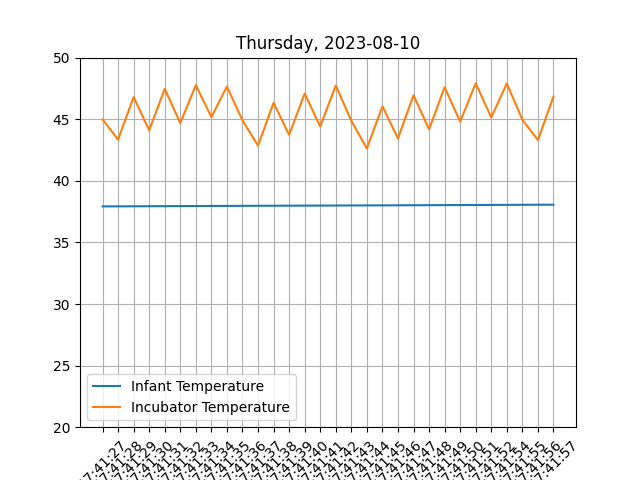

/tmp/ipykernel_9814/237803497.py:235: UserWarning: frames=None which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  self.ani = animation.FuncAnimation(self.fig, self.updateInfTemp, interval=500)
/tmp/ipykernel_9814/237803497.py:236: UserWarning: frames=None which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  self.ani2 = animation.FuncAnimation(self.fig, self.updateIncTemp, interval=500)


In [3]:
%matplotlib notebook

import threading
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import infinc
import time
import math
import socket
import fcntl
import os
import errno

import string

import secrets
from collections import deque
from threading import Lock
import hvac

#from run_vault import create_vault_client
#from run_vault import get_stored_token

import ssl


MAX_REQUESTS_PER_SECOND = 100
MAX_IPS = 10
TOKEN_EXPIRATION = 7200 # Vulnerability 5 access controls 7200/60 = 120 minutes


class SmartNetworkThermometer (threading.Thread) :
    open_cmds = ["AUTH", "LOGOUT"]
    prot_cmds = ["SET_DEGF", "SET_DEGC", "SET_DEGK", "GET_TEMP", "UPDATE_TEMP"]

    def __init__ (self, source, updatePeriod, port) :
        threading.Thread.__init__(self, daemon = True)
        #set daemon to be true, so it doesn't block program from exiting
        self.source = source
        self.updatePeriod = updatePeriod
        self.curTemperature = 0
        self.updateTemperature()
        self.tokens = []

        # After creating the server socket we setup SSL/TLS
        context = ssl.create_default_context(ssl.Purpose.CLIENT_AUTH)
        context.load_cert_chain(certfile='server-cert.pem', keyfile='server-key.pem',password='kong')
        # over TCP not UDP
        self.serverSocket = context.wrap_socket(socket.socket(socket.AF_INET, socket.SOCK_STREAM))
        self.serverSocket.bind(("127.0.0.1", port))
        self.serverSocket.listen(5)  # Listen for incoming connections



        self.deg = "K"


        # # Vulnerability 1 Dos/DDoS Rate limiter attributes
        self.max_requests_per_second = MAX_REQUESTS_PER_SECOND
        self.max_ips = MAX_IPS
        self.ip_request_times = {}
        self.ip_locks = {}

        # Set up the Vault client
        self.vault_client = create_vault_client()

    # Vulnerability 5 access controls
    def is_rate_limited(self, ip):
        if ip not in self.ip_request_times:
            self.ip_request_times[ip] = deque(maxlen=self.max_requests_per_second)
            self.ip_locks[ip] = Lock()

        with self.ip_locks[ip]:
            request_times = self.ip_request_times[ip]
            current_time = time.time()

            # Remove request times older than 1 second
            while request_times and current_time - request_times[0] > 1:
                request_times.popleft()

            # Check if the number of requests exceeds the limit
            if len(request_times) >= self.max_requests_per_second:
                return True

            # Add the current request time to the deque
            request_times.append(current_time)  # Missing line in your code

            return False




    # Vulnerability 5 access controls
    def generate_token(self):
        # Vulnerability fixing random and using secrets instead
        return ''.join(secrets.choice(string.ascii_uppercase + string.ascii_lowercase + string.digits) for _ in range(16))

    # Vulnerability 5 access controls
    def is_token_valid(self, token):
        for stored_token in self.tokens:
            if stored_token["token"] == token and (time.time() - stored_token["creation_time"]) <= TOKEN_EXPIRATION:
                return True
        return False

    # Vulnerability 5 access controls and Vulnerability 4 Input Validation
    def process_protected_commands(self, msg, clientSocket, token):
        if not self.is_token_valid(token):
            clientSocket.send(b"Bad Token\n")
            return

        cmds = msg.split(';')
        for c in cmds:
            if c in self.prot_cmds:
                if c == "GET_TEMP":
                    clientSocket.send(b"%f\n" % self.getTemperature())
                elif c == "UPDATE_TEMP":
                    self.updateTemperature()
                else:
                    clientSocket.send(b"Invalid Command\n")
            else:
                clientSocket.send(b"Invalid Command\n")


    def setSource(self, source) :
        self.source = source

    def setUpdatePeriod(self, updatePeriod) :
        self.updatePeriod = updatePeriod

    def setDegreeUnit(self, s) :
        self.deg = s
        if self.deg not in ["F", "K", "C"] :
            self.deg = "K"

    def updateTemperature(self) :
        self.curTemperature = self.source.getTemperature()

    def getTemperature(self) :
        if self.deg == "C" :
            return self.curTemperature - 273
        if self.deg == "F" :
            return (self.curTemperature - 273) * 9 / 5 + 32

        return self.curTemperature

    def processCommands(self, msg, clientSocket, ip):
        cmds = msg.split(';')
        for c in cmds:
            cs = c.split(' ')
            if len(cs) == 2:
                if cs[0] == "AUTH":
                    if cs[1] == get_stored_token(self.vault_client):
                        new_token = self.generate_token()
                        self.tokens.append({"token": new_token, "creation_time": time.time()})
                        clientSocket.send(new_token.encode("utf-8"))
                elif cs[0] == "LOGOUT":
                    if cs[1] in [token["token"] for token in self.tokens]:
                        self.tokens = [token for token in self.tokens if token["token"] != cs[1]]
                else:
                    clientSocket.send(b"Invalid Command\n")
            else:
                clientSocket.send(b"Bad Command\n")

        # Remove expired tokens
        current_time = time.time()
        self.tokens = [token for token in self.tokens if current_time <= token["creation_time"] + TOKEN_EXPIRATION]





    def run(self):
        while True:
            try:
                clientSocket, addr = self.serverSocket.accept()
                ip, _ = addr
                # Vulnerability 1 Dos/DDoS
                if len(self.ip_request_times) > self.max_ips:
                    clientSocket.send(b"Too many IPs\n")
                    clientSocket.close()
                    continue
                # Vulnerability 1 Dos/DDoS
                if self.is_rate_limited(ip):
                    clientSocket.send(b"Rate limited\n")
                    clientSocket.close()
                    continue

                msg = clientSocket.recv(1024).decode("utf-8").strip()
                cmds = msg.split(' ')
                if len(cmds) == 1:  # protected commands case
                    semi = msg.find(';')
                    if semi != -1:  # if we found the semicolon
                        token = msg[:semi]
                        self.process_protected_commands(msg[semi + 1:], clientSocket, token)
                    else:
                        clientSocket.send(b"Bad Command\n")
                elif len(cmds) == 2:
                    if cmds[0] in self.open_cmds:
                        self.processCommands(msg, clientSocket,ip)
                    else:
                        clientSocket.send(b"Authenticate First\n")
                else:
                    clientSocket.send(b"Bad Command\n")

                clientSocket.close()

            except IOError as e:
                if e.errno == errno.EWOULDBLOCK:
                    pass
                else:
                    pass
                msg = ""

            self.updateTemperature()
            time.sleep(self.updatePeriod)



class SimpleClient:
    def __init__(self, therm1, therm2):
        self.fig, self.ax = plt.subplots()
        now = time.time()
        self.lastTime = now
        self.times = [time.strftime("%H:%M:%S", time.localtime(now - i)) for i in range(30, 0, -1)]
        self.infTemps = [0] * 30
        self.incTemps = [0] * 30
        self.infLn, = plt.plot(range(30), self.infTemps, label="Infant Temperature")
        self.incLn, = plt.plot(range(30), self.incTemps, label="Incubator Temperature")
        plt.xticks(range(30), self.times, rotation=45)
        plt.ylim((20, 50))
        plt.legend(handles=[self.infLn, self.incLn])
        self.infTherm = therm1
        self.incTherm = therm2

        self.ani = animation.FuncAnimation(self.fig, self.updateInfTemp, interval=500)
        self.ani2 = animation.FuncAnimation(self.fig, self.updateIncTemp, interval=500)

        # SSL context for secure communication with disabled hostname and certificate verification
        # ONLY BECAUSE WE DO NOT HAVE A SIGNED CERT TO USE
        self.context = ssl.create_default_context(ssl.Purpose.SERVER_AUTH, cafile='server-cert.pem')
        self.context.check_hostname = False
        self.context.verify_mode = ssl.CERT_NONE

    def updateTime(self):
        now = time.time()
        if math.floor(now) > math.floor(self.lastTime):
            t = time.strftime("%H:%M:%S", time.localtime(now))
            self.times.append(t)
            # last 30 seconds of data
            self.times = self.times[-30:]
            self.lastTime = now
            plt.xticks(range(30), self.times, rotation=45)
            plt.title(time.strftime("%A, %Y-%m-%d", time.localtime(now)))

    # new method encapsulating the secure communication logic
    def secureUpdate(self, thermometer, port):
        temperature = thermometer.getTemperature() - 273
        with socket.socket(socket.AF_INET, socket.SOCK_STREAM) as s:
            with self.context.wrap_socket(s, server_hostname="127.0.0.1") as ssl_socket:
                ssl_socket.connect(("127.0.0.1", port))
                ssl_socket.sendall(str(temperature).encode("utf-8"))

    def updateInfTemp(self, frame):
        self.updateTime()
        self.secureUpdate(self.infTherm, 23456)

        self.infTemps.append(self.infTherm.getTemperature() - 273)
        self.infTemps = self.infTemps[-30:]
        self.infLn.set_data(range(30), self.infTemps)
        return self.infLn,

    def updateIncTemp(self, frame):
        self.updateTime()
        self.secureUpdate(self.incTherm, 23457)

        self.incTemps.append(self.incTherm.getTemperature() - 273)
        self.incTemps = self.incTemps[-30:]
        self.incLn.set_data(range(30), self.incTemps)
        return self.incLn,


UPDATE_PERIOD = .05 #in seconds
SIMULATION_STEP = .1 #in seconds

#create a new instance of IncubatorSimulator
bob = infinc.Human(mass = 8, length = 1.68, temperature = 36 + 273)
#bobThermo = infinc.SmartThermometer(bob, UPDATE_PERIOD)
bobThermo = SmartNetworkThermometer(bob, UPDATE_PERIOD, 23456)
bobThermo.start() #start the thread

inc = infinc.Incubator(width = 1, depth=1, height = 1, temperature = 37 + 273, roomTemperature = 20 + 273)
#incThermo = infinc.SmartNetworkThermometer(inc, UPDATE_PERIOD)
incThermo = SmartNetworkThermometer(inc, UPDATE_PERIOD, 23457)
incThermo.start() #start the thread

incHeater = infinc.SmartHeater(powerOutput = 1500, setTemperature = 45 + 273, thermometer = incThermo, updatePeriod = UPDATE_PERIOD)
inc.setHeater(incHeater)
incHeater.start() #start the thread

sim = infinc.Simulator(infant = bob, incubator = inc, roomTemp = 20 + 273, timeStep = SIMULATION_STEP, sleepTime = SIMULATION_STEP / 10)

sim.start()

sc = SimpleClient(bobThermo, incThermo)

plt.grid()
plt.show()

### Patched SampleNetworkClient.py

<IPython.core.display.Javascript object>


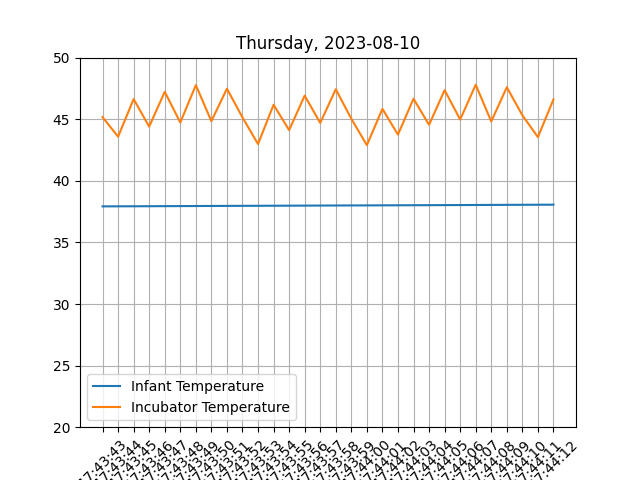

/tmp/ipykernel_9814/1627817768.py:64: UserWarning: frames=None which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  self.ani = animation.FuncAnimation(self.fig, self.updateInfTemp, interval=500)
/tmp/ipykernel_9814/1627817768.py:65: UserWarning: frames=None which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  self.ani2 = animation.FuncAnimation(self.fig, self.updateIncTemp, interval=500)


In [4]:
%matplotlib notebook
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import time
import math
import socket

import hvac
import sys
from functools import wraps

#from run_vault import get_stored_token
#from run_vault import create_vault_client

import ssl

# Vulnerability 1 rate limiting global constant
RATE_LIMIT = 100  # per second
TOKEN_EXPIRATION = 7200 # Vulnerability 4 - input validation: 7200/60 = 120 minutes

# Vulnerability 1 we provide a wrapper around functions that contact the server to limit them to maximum RATE_MINUTE calls per second
def rate_limited(max_per_second):
    min_interval = 1.0 / float(max_per_second)

    def decorate(func):
        last_time_called = [0.0]

        @wraps(func)
        def rate_limited_function(*args, **kwargs):
            elapsed = time.perf_counter() - last_time_called[0]
            left_to_wait = min_interval - elapsed
            if left_to_wait > 0:
                time.sleep(left_to_wait)
            ret = func(*args, **kwargs)
            last_time_called[0] = time.perf_counter()
            return ret

        return rate_limited_function

    return decorate


class SimpleNetworkClient:
    def __init__(self, port1, port2):
        self.fig, self.ax = plt.subplots()
        now = time.time()
        self.lastTime = now
        self.times = [time.strftime("%H:%M:%S", time.localtime(now - i)) for i in range(30, 0, -1)]
        self.infTemps = [0] * 30
        self.incTemps = [0] * 30
        self.infLn, = plt.plot(range(30), self.infTemps, label="Infant Temperature")
        self.incLn, = plt.plot(range(30), self.incTemps, label="Incubator Temperature")
        plt.xticks(range(30), self.times, rotation=45)
        plt.ylim((20, 50))
        plt.legend(handles=[self.infLn, self.incLn])
        self.infPort = port1
        self.incPort = port2

        # Vulnerability 5 access controls
        self.infToken = {"token": None, "expiration_time": 0}
        self.incToken = {"token": None, "expiration_time": 0}


        self.ani = animation.FuncAnimation(self.fig, self.updateInfTemp, interval=500)
        self.ani2 = animation.FuncAnimation(self.fig, self.updateIncTemp, interval=500)

        # Set up the Vault client
        self.vault_client = create_vault_client()

    # Vulnerability 5 access controls
    def is_token_valid(self, token):
        return token["expiration_time"] >= time.time()

    def updateTime(self):
        now = time.time()
        if math.floor(now) > math.floor(self.lastTime):
            t = time.strftime("%H:%M:%S", time.localtime(now))
            self.times.append(t)
            # last 30 seconds of data
            self.times = self.times[-30:]
            self.lastTime = now
            plt.xticks(range(30), self.times, rotation=45)
            plt.title(time.strftime("%A, %Y-%m-%d", time.localtime(now)))

    @rate_limited(RATE_LIMIT)
    def getTemperatureFromPort(self, p, tok):
        try:
            with socket.socket(socket.AF_INET, socket.SOCK_STREAM) as s:
                context = ssl.create_default_context(ssl.Purpose.SERVER_AUTH)
                context.check_hostname = False  # Disable hostname verification - ONLY BECAUSE WE DO NOT HAVE A SIGNED CERT TO USE
                context.verify_mode = ssl.CERT_NONE  # Disable certificate verification - ONLY BECAUSE WE DO NOT HAVE A SIGNED CERT TO USE
                ssl_socket = context.wrap_socket(s, server_hostname="127.0.0.1")
                ssl_socket.connect(("127.0.0.1", p))
                ssl_socket.sendall(b"%s;GET_TEMP" % tok.encode("utf-8"))
                msg = ssl_socket.recv(1024)
            m = msg.decode("utf-8")
            if m.startswith("Bad Token"):
                print("Received 'Bad Token' response, removing token and re-authenticating.")
                self.infToken["token"] = None
                return None
            try:
                temperature = float(m)
                return temperature
            except ValueError:
                print("Received non-numeric value:", m)
                return None  # Vulnerability 3 error handling: Return None on error
            except socket.error as e:
                print("Error receiving response from server:", e) #inside loop insight for vulnerability 3
                return None
        except socket.error as e:
            print("Socket error:", e)
            return None  # Vulnerability 3 error handling: Return None on error



    @rate_limited(RATE_LIMIT)
    def authenticate(self, p, pw):
        try:
            with socket.socket(socket.AF_INET, socket.SOCK_STREAM) as s:
                context = ssl.create_default_context(ssl.Purpose.SERVER_AUTH)
                context.check_hostname = False # Disable hostname verification - ONLY BECAUSE WE DO NOT HAVE A SIGNED CERT TO USE
                context.verify_mode = ssl.CERT_NONE # Disable certificate verification - ONLY BECAUSE WE DO NOT HAVE A SIGNED CERT TO USE
                ssl_socket = context.wrap_socket(s, server_hostname="127.0.0.1")
                ssl_socket.connect(("127.0.0.1", p))
                ssl_socket.sendall(b"AUTH %s" % pw)
                msg = ssl_socket.recv(1024).strip()
                token = msg.decode("utf-8")
                if token == "Bad Token":
                    print("Received 'Bad Token' response during authentication.")
                    return None
                # Vulnerability 5 access controls - we allow the TOKEN_EXPIRATION to be modified in this code, but Server ALWAYS CHECKS it is <= it's own set expiration time
                expiration_time = time.time() + TOKEN_EXPIRATION
                return {"token": token, "expiration_time": expiration_time}
        except socket.error as e:
            print("Socket error:", e)
            return None # Vulnerability 3 error handling: Return None on error

    def updateInfTemp(self, frame):
        self.updateTime()  # Vulnerability 5 access controls

        # Check if token is None or expired
        if self.infToken["token"] is None or not self.is_token_valid(self.infToken):
            new_token = self.authenticate(self.infPort, get_stored_token(self.vault_client).encode('utf-8'))
            if new_token is not None:
                self.infToken = new_token
            else:
                return self.infLn,  # Return early if token retrieval fails

        # Vulnerability 5 access controls
        if self.infToken["token"] is not None and self.is_token_valid(self.infToken):
            temperature = self.getTemperatureFromPort(self.infPort, self.infToken["token"])

            if temperature is not None and isinstance(temperature, float):
                self.infTemps.append(temperature - 273)
            else:
                print("Discarded non-float temperature:", temperature)  # Vulnerability 3 error handling for rate limiting

        self.infTemps = self.infTemps[-30:]
        self.infLn.set_data(range(30), self.infTemps)
        return self.infLn,



    def updateIncTemp(self, frame):
        self.updateTime()  # Vulnerability 5 access controls

        # Check if token is None or expired
        if self.incToken["token"] is None or not self.is_token_valid(self.incToken):
            new_token = self.authenticate(self.incPort, get_stored_token(self.vault_client).encode('utf-8'))
            if new_token is not None:
                self.incToken = new_token
            else:
                return self.incLn,  # Return early if token retrieval fails

        # Vulnerability 5 access controls
        if self.incToken["token"] is not None and self.is_token_valid(self.incToken):
            temperature = self.getTemperatureFromPort(self.incPort, self.incToken["token"])

            if temperature is not None and isinstance(temperature, float):
                self.incTemps.append(temperature - 273)
            else:
                print("Discarded non-float temperature:", temperature)  # Vulnerability 3 error handling for rate limiting

        self.incTemps = self.incTemps[-30:]
        self.incLn.set_data(range(30), self.incTemps)
        return self.incLn,


snc = SimpleNetworkClient(23456, 23457)

plt.grid()
plt.show()



### Vulnerability 1 & 2 - DoS and DDOS in SimpleNetworkClient.py and SimpleNetworkServer.py

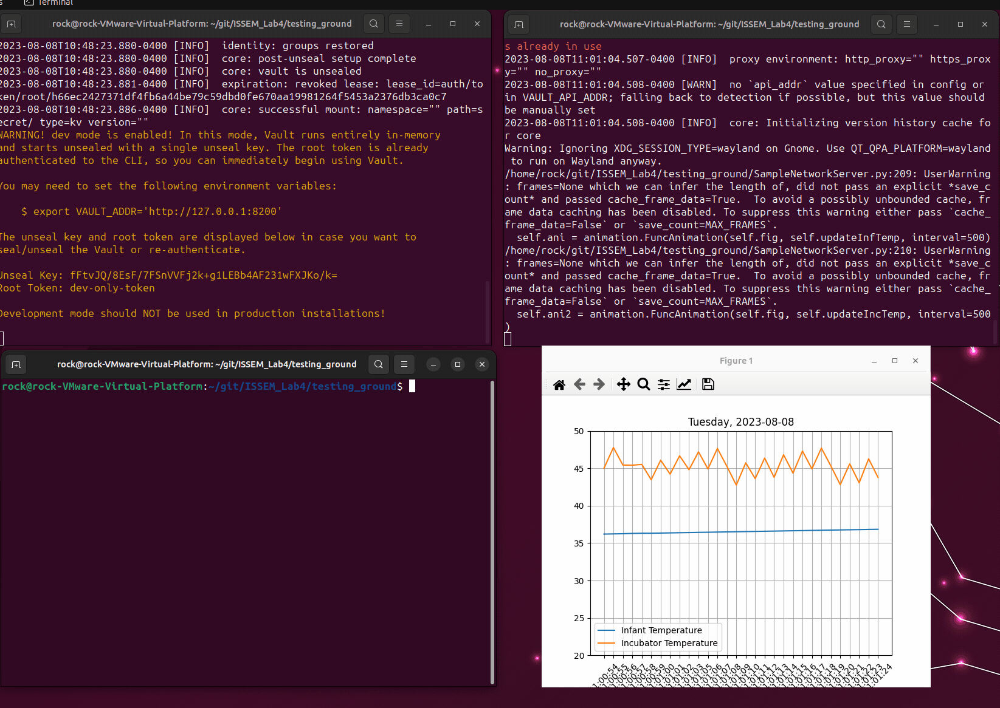

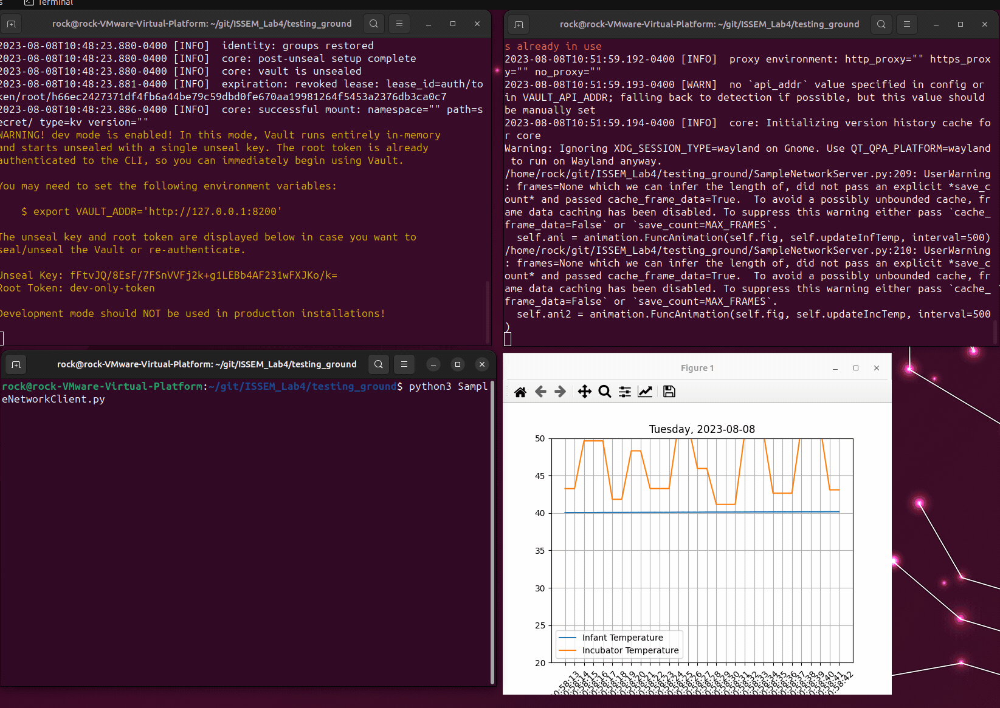

### Vulnerability 4 - Error Handling



We can see here a demonstration of failure to connect and lack of error handling completely disconnecting the system, and a patched version that will reconnect after failure.

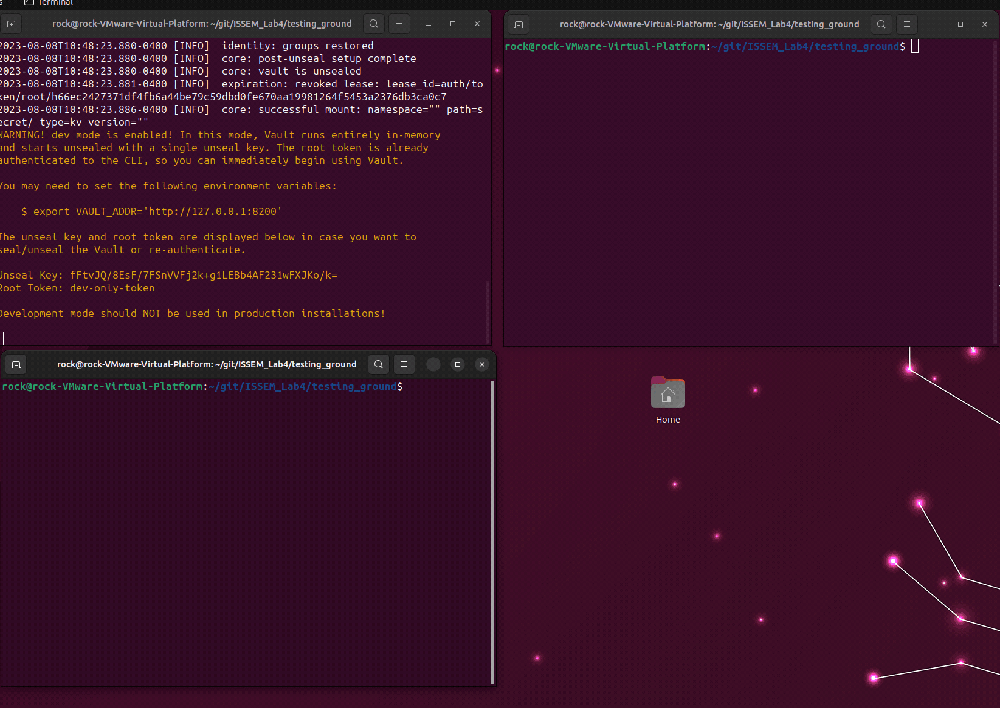

### Vulnerability 5 - Non-Secure Communication and UDP

<u>Statement</u>:

The entire codebase is built around plaintext communication over UDP causing authentication and reliability issues.

<u>Issue</u>:

The UDP (User Datagram Protocol) is a connectionless and lightweight communication protocol. While it offers low latency and reduced overhead, it lacks essential features like guaranteed delivery, error checking, and security mechanisms. In the case of an infant incubator, which relies on consistent and accurate communication for settings such as temperature, plaintext UDP poses significant risks:

1) Packet Sniffing Vulnerability: UDP packets are sent in plaintext, making them susceptible to interception by malicious actors. This exposes sensitive data, such as temperature settings and other control commands, to potential eavesdropping.

2) Lack of Reliability: UDP does not provide mechanisms for detecting lost or out-of-order packets. In critical applications like infant incubators, the loss of a packet containing a temperature setting could lead to improper control, jeopardizing the baby's health.

<u>Non-Technical Analogy - Safeguarding Infant Incubator Communication:</u>

Imagine we are sending secret messages to a friend using postcards. UDP is like sending these postcards without envelopes, allowing anyone to read the message. This could be disastrous if we are sending important instructions for an infant incubator. Additionally, if a postcard goes missing, our friend might not get the message and we would not know, leading to confusion and potential problems. By switching to TCP and using SSL/TLS, we are sending your messages in sealed envelopes that only your friend can open and we receive a delivery confirmation (on receipt). This ensures privacy and makes sure every message arrives safely, like crucial instructions for the incubator's temperature.

<u>Mitigating the Risks: Transition to TCP and SSL/TLS:</u>

To address the vulnerabilities associated with plaintext UDP communication, the decision was made to transition to the TCP (Transmission Control Protocol) along with the implementation of SSL/TLS (Secure Sockets Layer/Transport Layer Security) encryption.

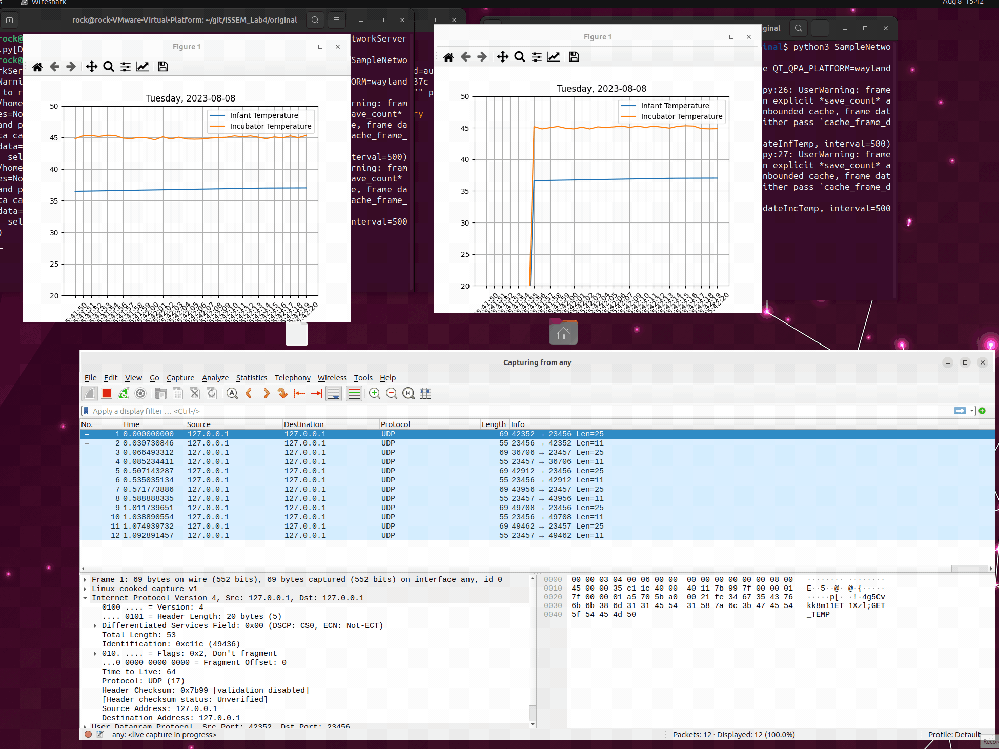

We can see in the animation that we have full ability to inspect any packet sent (as a 3rd party with network access)

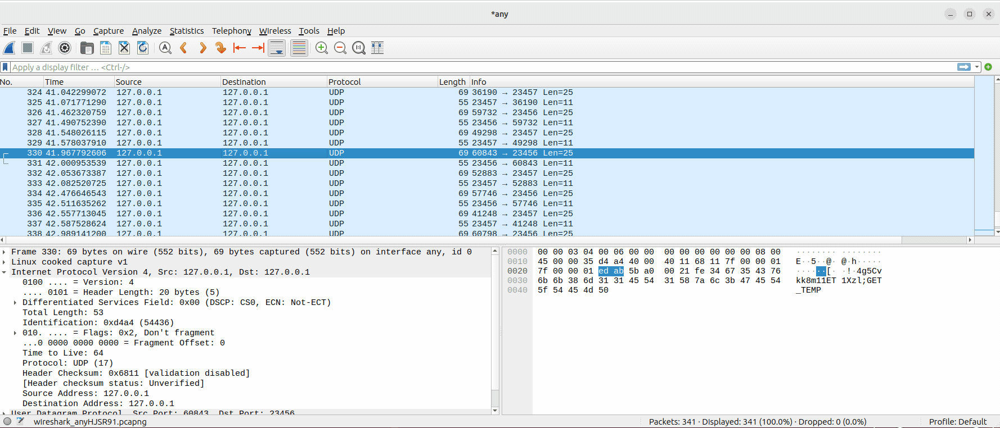

<u>Proof of Concept: Self-Signed Certificate Implementation:</u>

In the process of patching the vulnerabilities, a self-signed certificate was employed as a proof of concept. While a self-signed certificate lacks the validation of a trusted third-party Certificate Authority (CA), it demonstrates the implementation of SSL/TLS encryption. Below we can see the handshake captured.

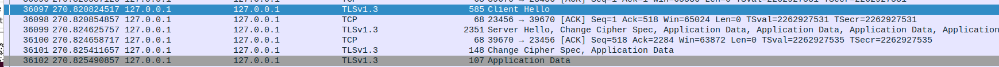

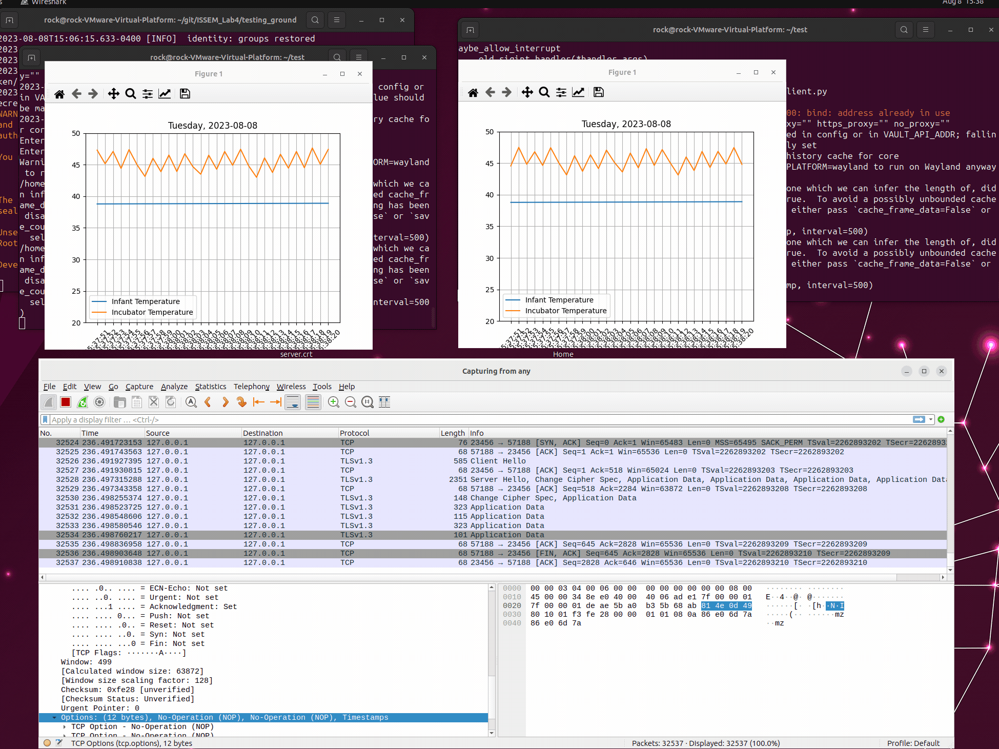

We observe the patch in action, providing full TLS communication and encrypted data.

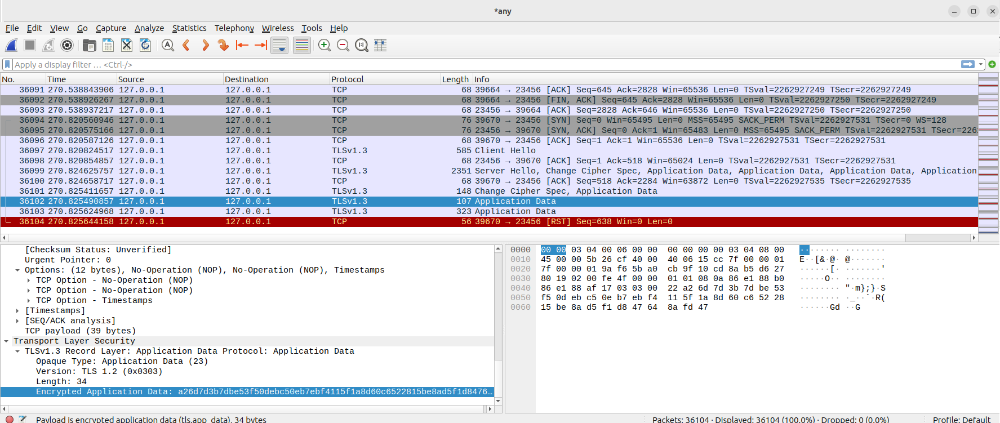

<u>Result:</u>

The transition from plaintext UDP communication to secure TCP with SSL/TLS encryption represents a significant step toward ensuring the safety and reliability of an infant incubator's control system. By addressing the vulnerabilities associated with plaintext communication and demonstrating the implementation of SSL/TLS through a self-signed certificate, the patch not only safeguards the delicate environment of an infant incubator but also highlights the importance of secure communication in any critical system.